## Repositório

[Tópicos Avançados em Inteligência Computacional 2](https://github.com/Manuelfjr/topicos_avancados_ic_ii/tree/develop)

## Atividade 06

**[LIME]**

descrição:

1. Leia sobre LIME no livro dop Molnar (pags. 168 a 173).

2. Crie um modelo para um problema de classificação do seu interesse. Escolha uma instância de cada classe do seu problema e use o LIME para gerar explicações do seu modelo.

## Introdução

informações: 
A base utilizada será a mesma da atividade `01`.

* **dataset**:  Breast cancer wisconsin (diagnostic)

* **Attribute Information**:
    - radius (mean of distances from center to points on the perimeter)

    - texture (standard deviation of gray-scale values)

    - perimeter

    - area

    - smoothness (local variation in radius lengths)

    - compactness (perimeter^2 / area - 1.0)

    - concavity (severity of concave portions of the contour)

    - concave points (number of concave portions of the contour)

    - symmetry

    - fractal dimension (“coastline approximation” - 1)

The mean, standard error, and “worst” or largest (mean of the three worst/largest values) of these features were computed for each image, resulting in 30 features. For instance, field 0 is Mean Radius, field 10 is Radius SE, field 20 is Worst Radius.

* **class**:
    - WDBC-Malignant (1)
    - WDBC-Benign (0)

## Descrição

Aplicar o LIME para gerar explicações locais para determinadas instâncias, considerando um modelo ja utilizado.

## Objetivo

Selecionar algumas instâncias de interesse para poder aplicar o método LIME sob elas, e então ter um feature importance localmente para cada classificação.

## 0. Basics

### 0.1 Imports

In [1]:
# datasets
# utils
import warnings
from typing import Any, Dict, Union

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from lime import lime_tabular
from sklearn.datasets import load_breast_cancer
# model
from sklearn.decomposition import PCA
from sklearn.ensemble import RandomForestClassifier
# metrics
from sklearn.inspection import permutation_importance
from sklearn.metrics import (accuracy_score, f1_score, make_scorer,
                             precision_score, recall_score, roc_auc_score)
from sklearn.model_selection import cross_val_score, train_test_split
from tqdm import tqdm

warnings.filterwarnings('ignore')

### 0.2 Methods

In [2]:
def func(x: int, a: int = 3, b: int = 3):
    return (x * a) // b


def calculate_metrics(
        model: Any,
        X: Union[pd.DataFrame, pd.Series, np.ndarray],
        y: Union[pd.DataFrame, pd.Series, np.ndarray],
        features: Union[list, np.ndarray],
        which_metrics: Dict[str, Any] = {"accuracy_score": accuracy_score},
        cv: int = 5,
) -> pd.DataFrame:
    """
    Calcula as métricas especificadas usando validação cruzada e retorna um DataFrame.

    Parâmetros:
        model (estimator): O modelo de aprendizado de máquina a ser avaliado.
        X (array-like): As features do conjunto de dados.
        y (array-like): Os rótulos do conjunto de dados.
        cv (int ou iterável): O esquema de validação cruzada a ser utilizado.
        which_metrics (dict): Um dicionário onde as chaves são os nomes das
                                métricas e os valores são as funções de métrica.

    Retorna:
        pd.DataFrame: Um DataFrame contendo as métricas calculadas.

    Exemplo:
        metrics = {
            'accuracy': accuracy_score,
            'precision': precision_score,
            'recall': recall_score
        }
        results = calculate_metrics(model, X, y, cv=5, which_metrics=metrics)
    """
    metrics = {}
    for m, metric in tqdm(which_metrics.items(), desc="Cros-validation"):
        metric = make_scorer(metric)
        value = [float(np.mean(cross_val_score(model, X[features], y, cv=cv, scoring=metric)))]
        metrics[m] = value

    if len(features) == X.shape[1]:
        index_name = ["all_features"]
    else:
        index_name = ["partial_features"]

    results = pd.DataFrame(metrics, index=index_name)
    return results

In [3]:
class LimeExplainer:
    """
    Classe para explicação de instâncias específicas usando Lime.

    Attributes:
    -----------
        X_train: Union[pd.DataFrame, np.ndarray]
            Conjunto de dados de treinamento.
        features: Union[list, np.ndarray]
            Lista de nomes das características.
        model: any
            Modelo de machine learning a ser explicado.
    """

    def __init__(self, X_train: Union[pd.DataFrame, np.ndarray], features: Union[list, np.ndarray], model: any):
        """
        Inicializa a classe LimeExplainer.

        Parameters:
        -----------
            X_train: Union[pd.DataFrame, np.ndarray]
                Conjunto de dados de treinamento.
            features: Union[list, np.ndarray]
                Lista de nomes das características.
            model: any
                Modelo de machine learning a ser explicado.
        """
        self.model = model
        self.features = features
        self.X_train = self._check_ifis_instance(X_train, features)

    def _check_ifis_instance(self, data: Union[pd.DataFrame, np.ndarray], features: Union[list, np.ndarray] = []):
        """
        Verifica se os dados são um DataFrame ou uma matriz numpy e retorna a parte correspondente.

        Parameters:
        -----------
            data: Union[pd.DataFrame, np.ndarray]
                Dados a serem verificados.
            features: Union[list, np.ndarray], opcional
                Lista de nomes das características.

        Returns:
        --------
            Union[np.ndarray]
                Dados correspondentes ao tipo de entrada.
        """
        if isinstance(data, pd.DataFrame) and (features != []):
            return data.loc[:, features].values
        elif isinstance(data, np.ndarray) and (features != []):
            return data[:, features]
        elif isinstance(data, pd.DataFrame) and (features == []):
            return data.iloc[0, :].values
        else:
            return data[0, :]

    def fit(self, features: Union[list, np.ndarray], **kwargs):
        """
        Ajusta o explainer LimeTabularExplainer.

        Parameters:
        -----------
            features: Union[list, np.ndarray]
                Lista de nomes das características.
            **kwargs
                Outros argumentos opcionais para passar para LimeTabularExplainer.

        Returns:
        --------
            LimeExplainer
                Retorna a própria instância da classe LimeExplainer.
        """
        self.explainer = lime_tabular.LimeTabularExplainer(
            self.X_train,
            feature_names=features,
            **kwargs
        )
        return self

    def explain_instance(self, instance: Union[pd.DataFrame, np.ndarray], show: bool = True, **kwargs) -> tuple:
        """
        Explica uma instância específica usando Lime.

        Parameters:
        -----------
            instance: Union[pd.DataFrame, np.ndarray]
                Instância específica para explicação.
            show: bool, opcional
                Se True, exibe a explicação na forma de um notebook interativo.
            **kwargs
                Outros argumentos opcionais para passar para explain_instance.

        Returns:
        --------
            tuple
                Uma tupla contendo a explicação gerada pelo Lime e a instância específica.
        """
        self.instance = self._check_ifis_instance(instance)
        self.explanation = self.explainer.explain_instance(
            self.instance,
            self.model.predict_proba,
            num_features=len(self.features),
            **kwargs
        )
        if show:
            self.show()
        else:
            return self

    def show(self, **kwargs):
        """
        Mostra a explicação gerada pelo Lime na forma de um notebook interativo.

        Parameters:
        -----------
            **kwargs
                Outros argumentos opcionais para passar para show_in_notebook.

        Returns:
        --------
            LimeExplainer
                Retorna a própria instância da classe LimeExplainer.
        """
        self.explanation.show_in_notebook(**kwargs)
        return self

### 0.3 Parameters

In [4]:
n_seed = 24
n_seed_pfi = 42
cv = 10
n_repeats = 30

In [5]:
params = {
    "holdout": {
        "test_size": 0.3,
        "random_state": 2024
    }
}

In [6]:
which_metrics = {
    "accuracy": accuracy_score,
    "precision": precision_score,
    "recall": recall_score,
    "f1": f1_score,
    "roc_auc": roc_auc_score
}

## 1. Preparando dataset

### 1.1 Leitura

In [7]:
target = "label"
content = load_breast_cancer()
features = list(content["feature_names"])

### 1.2 Process dataset

In [8]:
data = pd.DataFrame(
    content["data"],
    columns=features
)
data[target] = content["target"]
data.columns = (
    data
    .columns
    .str.replace(" ", "_")
    .str.replace("(", "")
    .str.replace(")", "")
)

### 1.3 Split

In [9]:
X = data.drop(target, axis=1).copy()
y = data[target].values

### 1.4 Holdout

aplicação do processo de holdout, considerando um tamanho de teste de `30%`

In [10]:
X_train, X_test, y_train, y_test = train_test_split(
    X,
    y,
    **params["holdout"]
)

## 2. Modelagem

### 2.1 Fit 

In [11]:
model = RandomForestClassifier(random_state=n_seed)
model.fit(X_train, y_train)

RandomForestClassifier(random_state=24)

### 2.2 Avaliando

In [12]:
full_model_metrics = calculate_metrics(model, X, y, X.columns, which_metrics=which_metrics, cv=cv)
full_model_metrics

Cros-validation: 100%|██████████| 5/5 [00:16<00:00,  3.24s/it]


,accuracy,precision,recall,f1,roc_auc
all_features,0.97193,0.9734,0.983175,0.977884,0.968211


## 3. Permutation Feature Importance (PFI)

### 3.1 Full model

In [13]:
result = permutation_importance(
    model,
    X_test,
    y_test,
    n_repeats=n_repeats,
    random_state=n_seed_pfi
)
sorted_idx = result.importances_mean.argsort()
del result["importances"]
result["features"] = X_test.columns
data_result_full = pd.DataFrame(result).set_index(["features"]).sort_values("importances_mean")

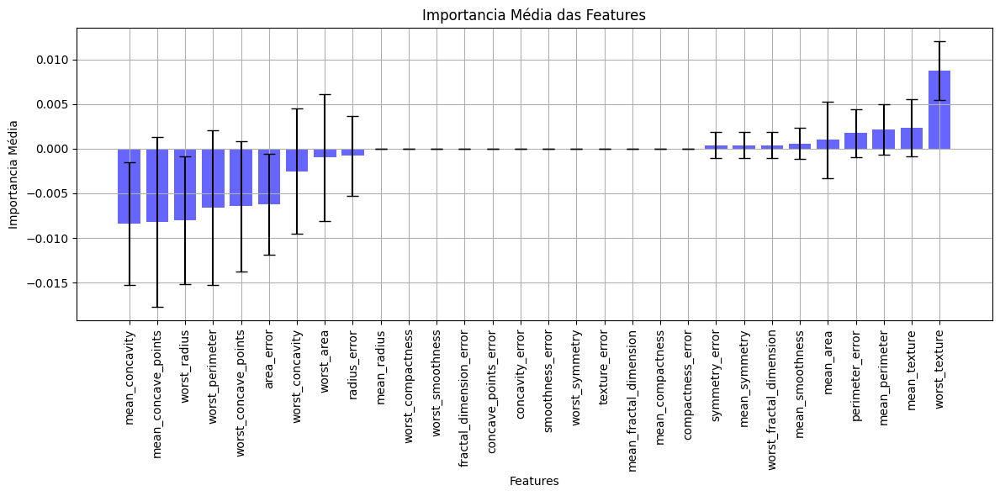

In [14]:
fig_full, axes_full = plt.subplots(1, 1, figsize=(12, 6))
axes_full.bar(
    data_result_full.index,
    data_result_full['importances_mean'],
    color='blue',
    alpha=0.6,
    yerr=data_result_full['importances_std'],
    capsize=5
)
axes_full.set_xlabel('Features')
axes_full.set_ylabel('Importancia Média')
axes_full.set_title('Importancia Média das Features')
axes_full.set_xticklabels(data_result_full.index, rotation=90)
fig_full.tight_layout()
axes_full.grid()
plt.show()

In [15]:
condition = data_result_full["importances_mean"] > 0

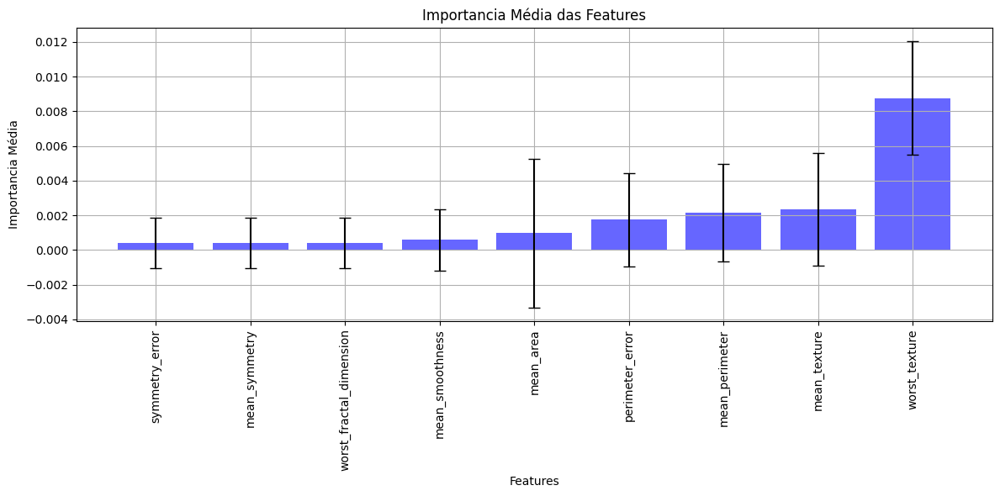

In [16]:
fig_full, axes_full = plt.subplots(1, 1, figsize=(12, 6))
axes_full.bar(
    data_result_full[condition].index,
    data_result_full[condition]['importances_mean'],
    color='blue',
    alpha=0.6,
    yerr=data_result_full[condition]['importances_std'],
    capsize=5
)
axes_full.set_xlabel('Features')
axes_full.set_ylabel('Importancia Média')
axes_full.set_title('Importancia Média das Features')
axes_full.set_xticklabels(data_result_full[condition].index, rotation=90)
fig_full.tight_layout()
axes_full.grid()
plt.show()

## 4. Re-treinando modelo com apenas features com importance importantes

### 4.1 Fit

In [17]:
features = data_result_full[condition].index

In [18]:
model = RandomForestClassifier(random_state=n_seed)
model.fit(X_train[features], y_train)

RandomForestClassifier(random_state=24)

### 4.2 Avaliação

In [19]:
partial_model_metrics = calculate_metrics(
    model,
    X,
    y,
    features,
    which_metrics=which_metrics,
    cv=cv
)
partial_model_metrics

Cros-validation: 100%|██████████| 5/5 [00:13<00:00,  2.68s/it]


,accuracy,precision,recall,f1,roc_auc
partial_features,0.952538,0.956618,0.971984,0.962969,0.946165


In [20]:
results = pd.concat([full_model_metrics, partial_model_metrics]).T

In [21]:
results

,all_features,partial_features
accuracy,0.971930,0.952538
precision,0.973400,0.956618
recall,0.983175,0.971984
f1,0.977884,0.962969
roc_auc,0.968211,0.946165


###  4.3 Analises

|            | **all_features** | **partial_features** |
|------------|--------------|------------------|
| **accuracy**   |   0.971930   |      0.952538    |
| **precision**  |   0.973400   |      0.956618    |
| **recall**     |   0.983175   |      0.971984    |
| **f1**         |   0.977884   |      0.962969    |
| **roc_auc**    |   0.968211   |      0.946165    |


Após analisar os resultados das validações cruzadas para o modelo utilizando todas as variáveis (*full_features*) em comparação com o modelo utilizando apenas as features maiores que zero (*partial_features*), podemos observar que ambos os modelos apresentam desempenho bastante semelhante em termos de métricas de avaliação, como *accuracy*, *precision*, *recall*, *f1* e *roc_auc*.

Isso sugere uma notável robustez do modelo, mesmo após a retirada das *features* que têm importância negativa. O modelo com menos variáveis, que utiliza apenas as que posssuem relevância para a classificação, segundo o *PFI*, mantém um desempenho praticamente proximo ao modelo completo. Essa consistência no desempenho indica que as *features* removidas não contribuem significativamente para a capacidade do modelo de fazer previsões precisas.

Portanto, a capacidade do modelo de manter um desempenho elevado mesmo após a remoção de *features* com baixa importância ressalta sua robustez e capacidade de generalização.  Além disso, apesar do modelo ainda manter uma boa performance apos a retirada das variáveis, ainda houve uma queda das metricas, isso evidencia também que existia alguma relação intrisica das variaveis que foram retiradas para com o target, havendo alguma importância que o método *Permutation Feature Importance* conseguiu mensurar na sua forma de estimação.

## 5. Selecionando instâncias

Nessa seção, o intuito será pegar as instâncias mais importantes para ambas as classes, com o intuito de definir os individuos mais representativos daquele grupo, e que maximizem a probabilidade de classe.

Mais a frente, também será selecionado instâncias ja apresentam probabilidades inferiores de pertencimento a determinada classe.

### 5.1 Aplicando PCA

Abaixo será aplicado um PCA para conseguir visualizar as instâncias em $\mathbb{R}^{2}$.

In [22]:
pca = PCA(2)
X_std = pca.fit_transform(X_train[features])

### 5.2 Selecionando as instancias mais representativas por classe

Abaixo sera selecionado instancias mais representativas por grupo, baseando-se  na media das features, e então aplicando o PCA para a visualização em $\mathbb{R}^{2}$.

In [23]:
X_centers = {
    "c0": X_train[y_train == 0][features].mean(axis=0).to_frame().T,
    "c1": X_train[y_train != 0][features].mean(axis=0).to_frame().T
}

In [24]:
X_c0_center = pca.transform(X_centers["c0"])
X_c1_center = pca.transform(X_centers["c1"])

### 5.3 Visualizando

In [25]:
x_values = np.linspace(X_std[:, 0].min(), X_std[:, 0].max(), 39)
y_values = np.linspace(X_std[:, 1].min(), X_std[:, 1].max(), 39)
x_grid, y_grid = np.meshgrid(x_values, y_values)

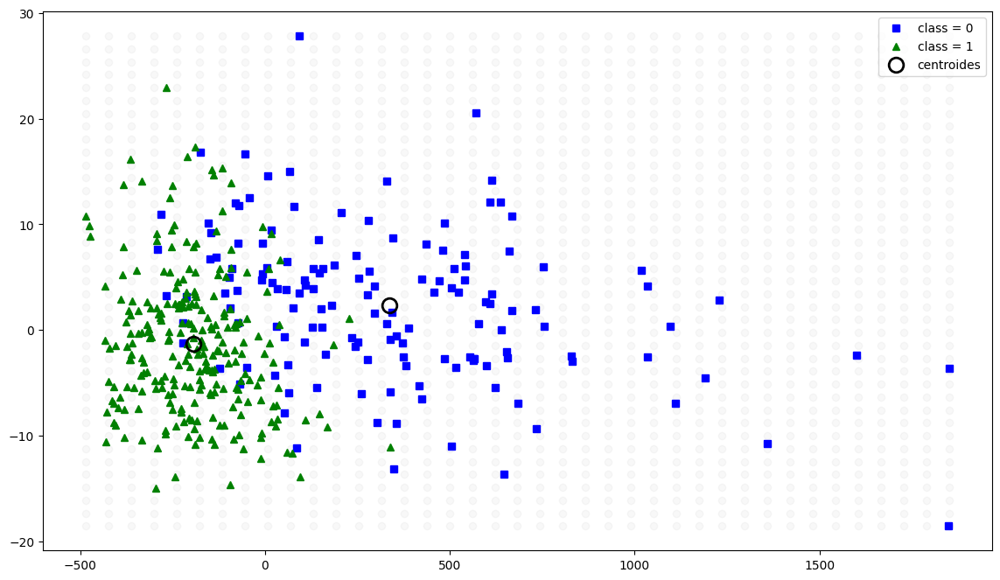

In [26]:
fig_i, axes = plt.subplots(1, 1, figsize=(14, 8))
axes.scatter(
    x_grid,
    y_grid,
    c='grey', alpha=0.05
)
axes.plot(
    X_std[y_train == 0, 0],
    X_std[y_train == 0, 1],
    "bs",
    label="class = 0"
)
axes.plot(
    X_std[y_train != 0, 0],
    X_std[y_train != 0, 1],
    "g^",
    label="class = 1"
)
axes.plot(
    np.array([X_c0_center[:, 0], X_c1_center[:, 0]]),
    np.array([X_c0_center[:, 1], X_c1_center[:, 1]]),
    "ko",
    markersize=12,
    markerfacecolor='none',
    markeredgewidth=2,
    label="centroides"
)
axes.legend()
plt.show()

### 5.4 Utilizando as probabilidades de pertencimento a classe positiva (cancer maligno)

Vamos tentar ilustrar um pouco melhor o gráfico acima, utilizando a classe positiva como referência, adicionado a probabilidade de pertencimento a classe positiva como informação ao gráfico

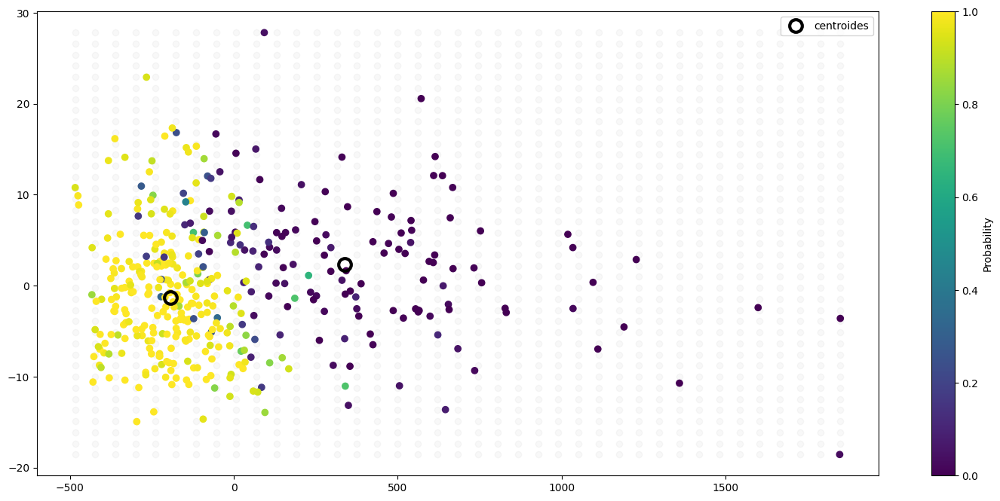

In [27]:
fig_probs, axes_probs = plt.subplots(1, 1, figsize=(18, 8))
axes_probs.scatter(
    x_grid,
    y_grid,
    c='grey', alpha=0.05
)
scatter = axes_probs.scatter(
    X_std[:, 0],
    X_std[:, 1],
    c=model.predict_proba(X_train[features])[:, 1],
    cmap='viridis'
)
axes_probs.plot(
    np.array([X_c0_center[:, 0], X_c1_center[:, 0]]),
    np.array([X_c0_center[:, 1], X_c1_center[:, 1]]),
    "ko",
    markersize=12,
    markerfacecolor='none',
    markeredgewidth=3,
    label="centroides"
)
fig_probs.colorbar(scatter, ax=axes_probs, label='Probability')
axes_probs.legend()
plt.show()

Podemos notar que aparentemente existe uma fronteira de decisão entre os grupos, aonde se espera que a probabilidade de pertencimento a classe positiva, se aproxima de 0.5, e a medida que se afasta de ambos os grupos, a probabilidade vai se aproximando de 0.

### 5.5 Selecionando mais algumas instâncias

Nesta seção, vamos selecionar duas instâncias a mais para analise sob o *Local Interpretable Model-Agnostic Explanations* (LIME), sendo eles seguindo as seguintes caracteristicas:

1. Instância distante do grupo da classe postiva;

2. Instância no exato ponto médio entre os centroides;

3. Instância em local com mais sobreposicao de classes.

Para o ponto (1.), vamos selecionar a instancia mais distante de ambos os grupos.

Já para o ponto (2.), vamos calcular o ponto médio entre os centroides de cada grupo.

exemplo:
$$
x_{pm} = \frac{x^{(0)}_{pm} + x^{(1)}_{pm}}{2}
$$

e

$$
y_{pm} = \frac{y^{(0)}_{pm} + y^{(1)}_{pm}}{2}
$$

Para o ponto (3.), sera selecionado manualmente a instância.

In [28]:
x_feats_1 = X_train.iloc[np.where((X_std[:, 0] > 1700) & (X_std[:, 1] > -5))[0], :][features].copy()
y_true_1 = y_train[np.where((X_std[:, 0] > 1700) & (X_std[:, 1] > -5))[0]][0]
x1 = pca.transform(x_feats_1)[0]

In [29]:
x_pm = (X_centers["c0"] + X_centers["c1"]) / 2
x2 = pca.transform(x_pm)[0]

In [30]:
x_feats_2 = X_train.iloc[
    np.where((X_std[:, 0] == -91.9109803837386) & (X_std[:, 1] == 5.880924007768748))[0], :
][features].copy()
y_true_2 = y_train[np.where((X_std[:, 0] == -91.9109803837386) & (X_std[:, 1] == 5.880924007768748))[0]][0]
x3 = pca.transform(x_feats_2)[0]

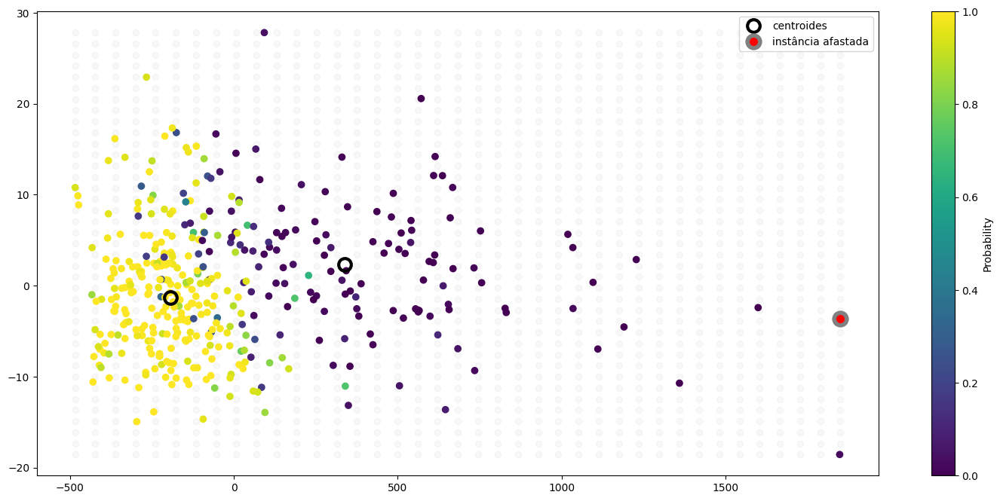

In [31]:
axes_probs.plot(
    x1[0],
    x1[1],
    "ko",
    markersize=12,
    markerfacecolor='red',
    markeredgewidth=4,
    markeredgecolor='gray',
    label="instância afastada"
)
axes_probs.legend()
fig_probs

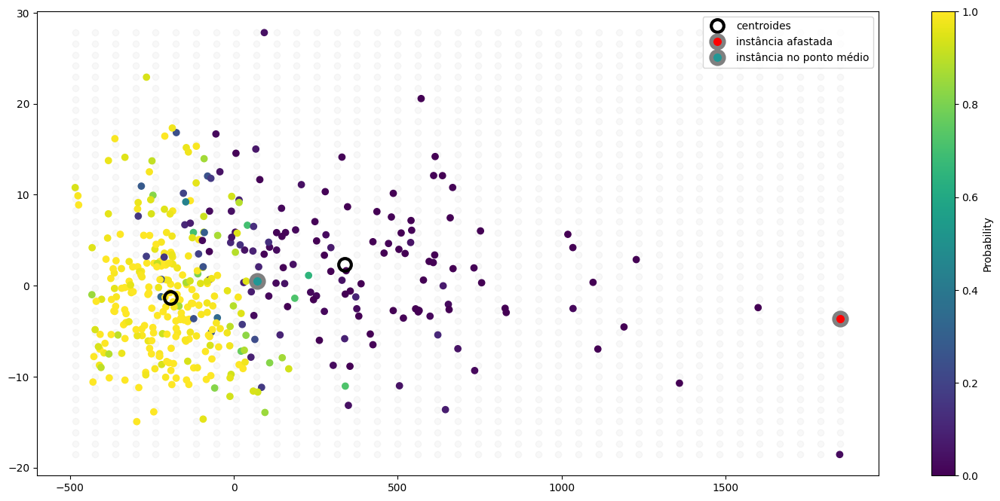

In [32]:
axes_probs.plot(
    x2[0],
    x2[1],
    "ko",
    markersize=12,
    markerfacecolor='#219795',
    markeredgewidth=4,
    markeredgecolor='gray',
    label="instância no ponto médio"
)
axes_probs.legend()
fig_probs

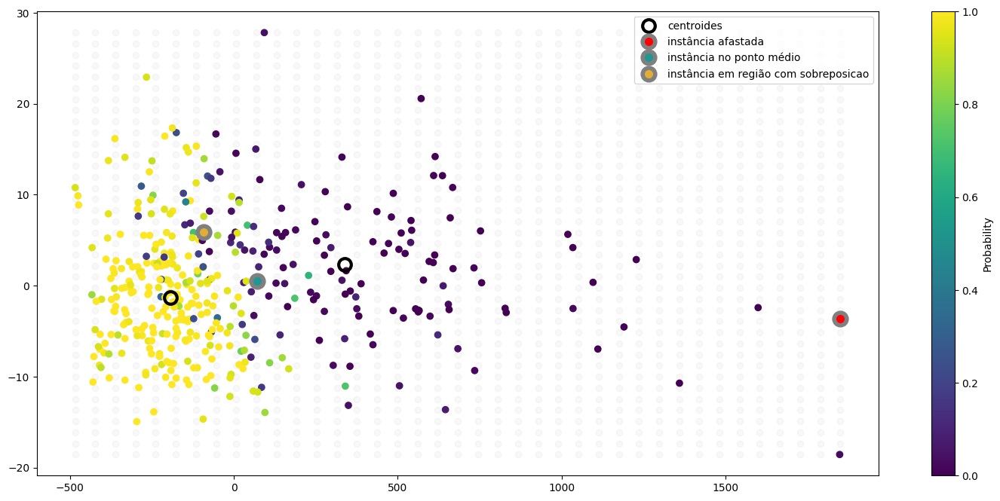

In [33]:
axes_probs.plot(
    x3[0],
    x3[1],
    "ko",
    markersize=12,
    markerfacecolor='#e2ad32',
    markeredgewidth=4,
    markeredgecolor='gray',
    label="instância em região com sobreposicao"
)
axes_probs.legend()
fig_probs

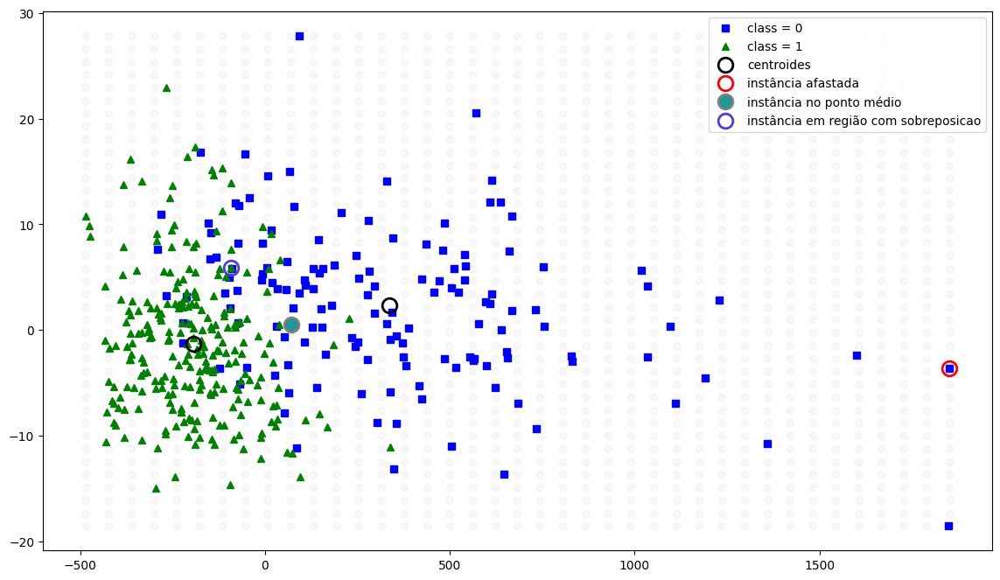

In [34]:
axes.plot(
    x1[0],
    x1[1],
    "ko",
    markersize=12,
    markerfacecolor='none',
    markeredgewidth=2,
    markeredgecolor='red',
    label="instância afastada"
)
axes.plot(
    x2[0],
    x2[1],
    "ko",
    markersize=12,
    markerfacecolor='#219795',
    markeredgewidth=2,
    markeredgecolor='gray',
    label="instância no ponto médio"
)
axes.plot(
    x3[0],
    x3[1],
    "ko",
    markersize=12,
    markerfacecolor='none',
    markeredgewidth=2,
    markeredgecolor='#553bd8',
    label="instância em região com sobreposicao"
)
axes.legend()
fig_i

|                        |     **$pca_{X_1}$**    |     **$pca_{X_2}$**    |     **true label**    |   
|------------------------|-----------|-----------|-----------|
| **instância afastada**    | 1850.4459 | -3.592414 | 0 |
| **instância no ponto médio**|  71.951322|  0.495681 | - |
| **instância em região com sobreposição**|  -91.91098038|  5.88092401 | 1 | 
| **centroide classe negativa**| 337.105269| 2.322356  | - |
| **centroide classe positiva**| -193.202625| -1.330995 | - |

## 6. LIME

Nesta seção, vamos aplicar o LIME sob as instâncias selecionadaras anteriormente, listadas na tabela acima.

### 6.1 Fit a classe criada para o LIME

In [35]:
le = LimeExplainer(X_train, list(features), model)
le.fit(
    mode='classification',
    features=features,
    class_names=np.unique(y_train),
    random_state=n_seed
)

### 6.1 Explain Instance: para cada uma das situações da seção anterior

#### 6.1.1 Centroide da classe negativa

In [36]:
le.explain_instance(X_centers["c0"], show=True)  # centroide classe 0

Nesse cenário, o intuito é mostrar quais são as variáveis mais importante para a instância que, em termos da média, melhor representa o grupo da classe 0. Dessa forma, podemos notar que a probabilidade de pertencimento a esse grupo para essa isntância é 1,  mostrando que valores de variaveis como perimeter_error > 3.33 ou mean_area > 776.17 para uma instância foram bem impactantes para essa instância localmente.

#### 6.1.2 Centroide da classe positiva

In [37]:
le.explain_instance(X_centers["c1"], show=True)  # centroide classe 1

Diferente da situação da seção (6.1.1), essa isntância que, em termos da média, melhor representa o grupo positivo, podemos notar que para as mesmas variáveis perimeter_error e mean_area, possuem valores bem  diferente, aonde temos perimeter_error < 1.6, mean_area > 418.98 e mean_perimeter < 75.04, mostrando que para a classificação dessa instância em especifico essas featuresd foram mais importantes.

#### 6.1.3 Instância mais distante do grupo positivo

In [38]:
print("True label: [{}]".format(y_true_1))
le.explain_instance(x_feats_1, show=True)  # instancia mais distante do grupo 01

True label: [0]


Nesse cenário, temos uma situação similar a seção (6.1.1), aonde as mesmas variáveis tiveram maior importancia para a classificação. Como podemos ver, o modelo classificou corretamente essa instância, então a decisão correta foi tomada.

#### 6.1.4 Instância no ponto médio entre os centroides

In [39]:
le.explain_instance(x_pm, show=True)  # instancia no ponto medio entre os centroides

Nitidamente podemos notar que o modelo ja apresentou um grau de incerteza maior ao classificar essa instância, apresentando valores de features que se enquadram melhor na classe postiva, contudo predominou a classe negativa, então o ponto médio seria considerado, majoritariamente como da classe 0, segundo o modelo.

#### 6.1.5 Instância em região com overlapping

In [40]:
print("True label: [{}]".format(y_true_2))
le.explain_instance(x_feats_2, show=True)  # instância em região com overlapping

True label: [1]


Apesar de haver uma alta incerteza na hora do modelo tomar a decisão, devido a valores de features tambem que se enquadram na classe negativa,o modelo classificou corretamente a instância, apesar  do overllapping, e com uma probabilidade de classe alta, evidenciando uma certa robustez para tratar com casos de overlapping, considerando esse modelo sob o conjunto de dados breast_cancer.

#### 6.1.6 Overall

In [41]:
le.explain_instance(X_centers["c0"], show=True)  # centroide classe negativa
le.explain_instance(X_centers["c1"], show=True)  # centroide classe positiva
le.explain_instance(x_feats_1, show=True)  # instancia mais distante do grupo positiva
le.explain_instance(x_pm, show=True)  # instancia no ponto medio entre os centroides
le.explain_instance(x_feats_2, show=True)  # instância em região com overlapping

Acima, podemos notar que as instancias relacionadas aos ponto medio entre os centroides e a instancia com overlapping, apesar de apresentarem probabilidades de classe altas, os valores das feature importance sao aparentam ter nenhuma variavel significante para a classificacao, evidenciando que o modelo apresentou uma alta incerteza na decisão sobre esses pontos.

## 7. Conclusão

O LIME é uma métrica muito boa para avaliação pontualmente de instâncias, aonde é possivel ter uma analise  similar a uma arvore de decisão, podendo evidenciar pontos de cortes para aquela previsão.  O LIME aparenta ser bem interessante quando visamos utilizar métodos mais "agradaveis" para visualizar uma importancia de determinadas previsões, tanto para alguem leigo quanto alguem por dentro da área.

Além de ser uma técnica eficiente, ela consegue auxiliar diretamente na tarefa de prevenção, evidenciando que features estão intrisicamente com a classe positiva ou negativa, um exemplo de cenário disso seria o cenário do conjunto de dados abordado, *breast cancer*.